## Import Libraries

In [167]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#EDA
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.graph_objs as go
import plotly.express as px
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import plotly.figure_factory as ff
import datetime as dt
import seaborn as sns

#Cleaning,Sampling and Encoding
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer # detect & handle NaNs
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, OneHotEncoder # Ordinal Encoding, Nominal Encoding
from category_encoders import BinaryEncoder # Nominal Encoding
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

# Modeling
## 1) Pipeline
from sklearn.pipeline import Pipeline, make_pipeline # to make pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer, make_column_selector # apply pipeline to each column
from sklearn.preprocessing import PolynomialFeatures

## 2') Classfication Models
from sklearn import tree
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB, BernoulliNB, CategoricalNB, MultinomialNB
from sklearn.svm import LinearSVC, SVC, LinearSVR, SVR
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import BaggingClassifier, BaggingRegressor, RandomForestClassifier, RandomForestRegressor, ExtraTreesClassifier, ExtraTreesRegressor # Bagging & Pasting
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor, GradientBoostingClassifier, GradientBoostingRegressor, HistGradientBoostingClassifier, HistGradientBoostingRegressor # Boosting
from sklearn.ensemble import VotingClassifier, VotingRegressor # Ensemble (Voting)
from sklearn.ensemble import StackingClassifier, StackingRegressor # Stacking
import lightgbm as lgb
from sklearn import metrics
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, KFold

## 3) Model Selection (Underfitting vs Overfitting) [bias variance tradeoff => perfect model complexity]
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score, cross_val_predict, StratifiedKFold, GridSearchCV, RandomizedSearchCV # (Train - Valid - Test) + hyperparameters tunning
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV, HalvingRandomSearchCV # if data / features is large
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error # Evaluate Model: r2=> accuracy, L2-norm: if no outliers, L1-norm: if outliers
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score, precision_recall_curve, roc_curve, roc_auc_score
from scipy import stats # Confidence Interval of Accuracy / Loss / Utility
import joblib # save model

In [168]:
pip install ImbPipeline

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement ImbPipeline (from versions: none)

[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: No matching distribution found for ImbPipeline


In [169]:
pip install imbalanced-learn


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [170]:
pip install cloudpickle

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [171]:
pip install --upgrade nbformat

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [172]:
pip install xgboost


[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [173]:
import nbformat
print(nbformat.__version__)


5.10.4


# 1) Understand Data

* a) understand columns

* b) check dtypes
* c) describe num cols

In [174]:
# a) understand columns
df = pd.read_csv("census.csv")
df

,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45217,33,Private,Bachelors,13.0,Never-married,Prof-specialty,Own-child,White,Male,0.0,0.0,40.0,United-States,<=50K
45218,39,Private,Bachelors,13.0,Divorced,Prof-specialty,Not-in-family,White,Female,0.0,0.0,36.0,United-States,<=50K
45219,38,Private,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Husband,White,Male,0.0,0.0,50.0,United-States,<=50K
45220,44,Private,Bachelors,13.0,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455.0,0.0,40.0,United-States,<=50K


In [175]:
list(map(lambda arg: arg.lower().strip().replace(' ', '_'), df.columns))

['age',
 'workclass',
 'education_level',
 'education-num',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital-gain',
 'capital-loss',
 'hours-per-week',
 'native-country',
 'income']

In [176]:
columns_names = list(df.columns)
for i in range(len(columns_names)):
    columns_names[i] = columns_names[i].lower().strip().replace(' ', '_')
columns_names

['age',
 'workclass',
 'education_level',
 'education-num',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital-gain',
 'capital-loss',
 'hours-per-week',
 'native-country',
 'income']

In [177]:
df.columns = columns_names

In [178]:
#b)check dtype
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45222 entries, 0 to 45221
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   age              45222 non-null  int64  
 1   workclass        45222 non-null  object 
 2   education_level  45222 non-null  object 
 3   education-num    45222 non-null  float64
 4   marital-status   45222 non-null  object 
 5   occupation       45222 non-null  object 
 6   relationship     45222 non-null  object 
 7   race             45222 non-null  object 
 8   sex              45222 non-null  object 
 9   capital-gain     45222 non-null  float64
 10  capital-loss     45222 non-null  float64
 11  hours-per-week   45222 non-null  float64
 12  native-country   45222 non-null  object 
 13  income           45222 non-null  object 
dtypes: float64(4), int64(1), object(9)
memory usage: 4.8+ MB


In [179]:
# c) describe num cols
df.describe()

,age,education-num,capital-gain,capital-loss,hours-per-week
count,45222.000000,45222.000000,45222.000000,45222.000000,45222.000000
mean,38.547941,10.118460,1101.430344,88.595418,40.938017
std,13.217870,2.552881,7506.430084,404.956092,12.007508
min,17.000000,1.000000,0.000000,0.000000,1.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000
75%,47.000000,13.000000,0.000000,0.000000,45.000000
max,90.000000,16.000000,99999.000000,4356.000000,99.000000


In [180]:
# categorical data
cat_columns = df.select_dtypes(include="O").columns
for col in cat_columns:
    print(f"number of uniques of \'{col}\' is: {df[col].nunique()}")
    print(f"uniques is: {df[col].unique()}")
    print()
    print("*" * 50)
    print()
print("*" * 50)



number of uniques of 'workclass' is: 7
uniques is: [' State-gov' ' Self-emp-not-inc' ' Private' ' Federal-gov' ' Local-gov'
 ' Self-emp-inc' ' Without-pay']

**************************************************

number of uniques of 'education_level' is: 16
uniques is: [' Bachelors' ' HS-grad' ' 11th' ' Masters' ' 9th' ' Some-college'
 ' Assoc-acdm' ' 7th-8th' ' Doctorate' ' Assoc-voc' ' Prof-school'
 ' 5th-6th' ' 10th' ' Preschool' ' 12th' ' 1st-4th']

**************************************************

number of uniques of 'marital-status' is: 7
uniques is: [' Never-married' ' Married-civ-spouse' ' Divorced'
 ' Married-spouse-absent' ' Separated' ' Married-AF-spouse' ' Widowed']

**************************************************

number of uniques of 'occupation' is: 14
uniques is: [' Adm-clerical' ' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Sales' ' Transport-moving' ' Farming-fishing'
 ' Machine-op-inspct' ' Tech-support' ' Craft-repair' ' Protectiv

In [181]:
print(f"number of uniques of native-country is: {df['native-country'].nunique()}")
print(f"uniques is: {df['native-country'].unique()}")

number of uniques of native-country is: 41
uniques is: [' United-States' ' Cuba' ' Jamaica' ' India' ' Mexico' ' Puerto-Rico'
 ' Honduras' ' England' ' Canada' ' Germany' ' Iran' ' Philippines'
 ' Poland' ' Columbia' ' Cambodia' ' Thailand' ' Ecuador' ' Laos'
 ' Taiwan' ' Haiti' ' Portugal' ' Dominican-Republic' ' El-Salvador'
 ' France' ' Guatemala' ' Italy' ' China' ' South' ' Japan' ' Yugoslavia'
 ' Peru' ' Outlying-US(Guam-USVI-etc)' ' Scotland' ' Trinadad&Tobago'
 ' Greece' ' Nicaragua' ' Vietnam' ' Hong' ' Ireland' ' Hungary'
 ' Holand-Netherlands']


In [182]:
df['race'].unique()

array([' White', ' Black', ' Asian-Pac-Islander', ' Amer-Indian-Eskimo',
       ' Other'], dtype=object)

In [183]:
df['native-country'].unique()

array([' United-States', ' Cuba', ' Jamaica', ' India', ' Mexico',
       ' Puerto-Rico', ' Honduras', ' England', ' Canada', ' Germany',
       ' Iran', ' Philippines', ' Poland', ' Columbia', ' Cambodia',
       ' Thailand', ' Ecuador', ' Laos', ' Taiwan', ' Haiti', ' Portugal',
       ' Dominican-Republic', ' El-Salvador', ' France', ' Guatemala',
       ' Italy', ' China', ' South', ' Japan', ' Yugoslavia', ' Peru',
       ' Outlying-US(Guam-USVI-etc)', ' Scotland', ' Trinadad&Tobago',
       ' Greece', ' Nicaragua', ' Vietnam', ' Hong', ' Ireland',
       ' Hungary', ' Holand-Netherlands'], dtype=object)

In [184]:
df['relationship'].unique()

array([' Not-in-family', ' Husband', ' Wife', ' Own-child', ' Unmarried',
       ' Other-relative'], dtype=object)

In [185]:
for col in cat_columns:
    print(f"count of each unique in \'{col}\' is:\n{df[col].value_counts()}")
    print()
    print("*" * 50)
    print()

count of each unique in 'workclass' is:
workclass
Private             33307
Self-emp-not-inc     3796
Local-gov            3100
State-gov            1946
Self-emp-inc         1646
Federal-gov          1406
Without-pay            21
Name: count, dtype: int64

**************************************************

count of each unique in 'education_level' is:
education_level
HS-grad         14783
Some-college     9899
Bachelors        7570
Masters          2514
Assoc-voc        1959
11th             1619
Assoc-acdm       1507
10th             1223
7th-8th           823
Prof-school       785
9th               676
12th              577
Doctorate         544
5th-6th           449
1st-4th           222
Preschool          72
Name: count, dtype: int64

**************************************************

count of each unique in 'marital-status' is:
marital-status
Married-civ-spouse       21055
Never-married            14598
Divorced                  6297
Separated                 1411
Widowed     

# Feature Extraction

In [186]:
df["age"].min()

np.int64(17)

In [187]:
df["age"].max()

np.int64(90)

In [188]:
def determine_age_range(arg): 
    if arg > 16 and arg <= 24:
        return 'Young Adulthood'
    elif arg > 24 and arg < 40:
        return "Young Middle-Age"
    elif arg > 40 and arg < 65:
        return "Adult"
    elif arg > 65:
        return 'Seniors'
    else:
        return 'Child'

df['Age Ranges'] = df['age'].apply(determine_age_range)
df[["Age Ranges","age"]].head(20)

,Age Ranges,age
0,Young Middle-Age,39
1,Adult,50
2,Young Middle-Age,38
3,Adult,53
4,Young Middle-Age,28
5,Young Middle-Age,37
6,Adult,49
7,Adult,52
8,Young Middle-Age,31
9,Adult,42


In [189]:
def work_life_balance(hours, marital_status):
    if hours > 50 and "Married" in marital_status:
        return "Low Balance"
    elif hours > 50:
        return "Moderate Balance"
    elif hours > 30:
        return "Good Balance"
    else:
        return "High Balance"

df["Work_Life_Balance"] = df.apply(lambda row: work_life_balance(row["hours-per-week"], row["marital-status"]), axis=1)

In [190]:
df["Work_Life_Balance"].unique()

array(['Good Balance', 'High Balance', 'Low Balance', 'Moderate Balance'],
      dtype=object)

In [191]:
def income_per_hour(capital_gain, capital_loss, hours_per_week):
    if hours_per_week > 0:  # Avoid division by zero
        return (capital_gain + capital_loss) / hours_per_week
    else:
        return 0  # Assign 0 if hours-per-week is zero

df["Income_per_Hour"] = df.apply(lambda row: income_per_hour(row["capital-gain"], row["capital-loss"], row["hours-per-week"]), axis=1)


In [192]:
df[["Work_Life_Balance","hours-per-week"]].head(20)

,Work_Life_Balance,hours-per-week
0,Good Balance,40.0
1,High Balance,13.0
2,Good Balance,40.0
3,Good Balance,40.0
4,Good Balance,40.0
5,Good Balance,40.0
6,High Balance,16.0
7,Good Balance,45.0
8,Good Balance,50.0
9,Good Balance,40.0


In [193]:
df["Age Ranges"].unique()

array(['Young Middle-Age', 'Adult', 'Young Adulthood', 'Child', 'Seniors'],
      dtype=object)

In [194]:
df["marital-status"].unique()

array([' Never-married', ' Married-civ-spouse', ' Divorced',
       ' Married-spouse-absent', ' Separated', ' Married-AF-spouse',
       ' Widowed'], dtype=object)

In [195]:
df[["education-num","education_level"]].head(10)

,education-num,education_level
0,13.0,Bachelors
1,13.0,Bachelors
2,9.0,HS-grad
3,7.0,11th
4,13.0,Bachelors
5,14.0,Masters
6,5.0,9th
7,9.0,HS-grad
8,14.0,Masters
9,13.0,Bachelors


In [196]:
df.columns

Index(['age', 'workclass', 'education_level', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income', 'Age Ranges', 'Work_Life_Balance', 'Income_per_Hour'],
      dtype='object')

In [197]:
#b)check dtype
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45222 entries, 0 to 45221
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age                45222 non-null  int64  
 1   workclass          45222 non-null  object 
 2   education_level    45222 non-null  object 
 3   education-num      45222 non-null  float64
 4   marital-status     45222 non-null  object 
 5   occupation         45222 non-null  object 
 6   relationship       45222 non-null  object 
 7   race               45222 non-null  object 
 8   sex                45222 non-null  object 
 9   capital-gain       45222 non-null  float64
 10  capital-loss       45222 non-null  float64
 11  hours-per-week     45222 non-null  float64
 12  native-country     45222 non-null  object 
 13  income             45222 non-null  object 
 14  Age Ranges         45222 non-null  object 
 15  Work_Life_Balance  45222 non-null  object 
 16  Income_per_Hour    452

In [198]:
# c) describe num cols
df.describe()

,age,education-num,capital-gain,capital-loss,hours-per-week,Income_per_Hour
count,45222.000000,45222.000000,45222.000000,45222.000000,45222.000000,45222.000000
mean,38.547941,10.118460,1101.430344,88.595418,40.938017,28.020455
std,13.217870,2.552881,7506.430084,404.956092,12.007508,184.589854
min,17.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000,0.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000,0.000000
75%,47.000000,13.000000,0.000000,0.000000,45.000000,0.000000
max,90.000000,16.000000,99999.000000,4356.000000,99.000000,11365.000000


In [199]:
# categorical data
cat_columns = df.select_dtypes(include="O").columns
for col in cat_columns:
    print(f"number of uniques of \'{col}\' is: {df[col].nunique()}")
    print(f"uniques is: {df[col].unique()}")
    print()
    print("*" * 50)
    print()
print("*" * 50)



number of uniques of 'workclass' is: 7
uniques is: [' State-gov' ' Self-emp-not-inc' ' Private' ' Federal-gov' ' Local-gov'
 ' Self-emp-inc' ' Without-pay']

**************************************************

number of uniques of 'education_level' is: 16
uniques is: [' Bachelors' ' HS-grad' ' 11th' ' Masters' ' 9th' ' Some-college'
 ' Assoc-acdm' ' 7th-8th' ' Doctorate' ' Assoc-voc' ' Prof-school'
 ' 5th-6th' ' 10th' ' Preschool' ' 12th' ' 1st-4th']

**************************************************

number of uniques of 'marital-status' is: 7
uniques is: [' Never-married' ' Married-civ-spouse' ' Divorced'
 ' Married-spouse-absent' ' Separated' ' Married-AF-spouse' ' Widowed']

**************************************************

number of uniques of 'occupation' is: 14
uniques is: [' Adm-clerical' ' Exec-managerial' ' Handlers-cleaners' ' Prof-specialty'
 ' Other-service' ' Sales' ' Transport-moving' ' Farming-fishing'
 ' Machine-op-inspct' ' Tech-support' ' Craft-repair' ' Protectiv

In [200]:
print(f"number of uniques of Age Ranges is: {df['Age Ranges'].nunique()}")
print(f"uniques is: {df['Age Ranges'].unique()}")

number of uniques of Age Ranges is: 5
uniques is: ['Young Middle-Age' 'Adult' 'Young Adulthood' 'Child' 'Seniors']


In [201]:
print(f"number of uniques of relationship is: {df['relationship'].nunique()}")
print(f"uniques is: {df['relationship'].unique()}")

number of uniques of relationship is: 6
uniques is: [' Not-in-family' ' Husband' ' Wife' ' Own-child' ' Unmarried'
 ' Other-relative']


In [202]:
print(f"number of uniques of race is: {df['race'].nunique()}")
print(f"uniques is: {df['race'].unique()}")

number of uniques of race is: 5
uniques is: [' White' ' Black' ' Asian-Pac-Islander' ' Amer-Indian-Eskimo' ' Other']


In [203]:
print(f"number of uniques of Work Life Balance is: {df['Work_Life_Balance'].nunique()}")
print(f"uniques is: {df['Work_Life_Balance'].unique()}")

number of uniques of Work Life Balance is: 4
uniques is: ['Good Balance' 'High Balance' 'Low Balance' 'Moderate Balance']


In [204]:
print(f"number of uniques of native-country is: {df['native-country'].nunique()}")
print(f"uniques is: {df['native-country'].unique()}")

number of uniques of native-country is: 41
uniques is: [' United-States' ' Cuba' ' Jamaica' ' India' ' Mexico' ' Puerto-Rico'
 ' Honduras' ' England' ' Canada' ' Germany' ' Iran' ' Philippines'
 ' Poland' ' Columbia' ' Cambodia' ' Thailand' ' Ecuador' ' Laos'
 ' Taiwan' ' Haiti' ' Portugal' ' Dominican-Republic' ' El-Salvador'
 ' France' ' Guatemala' ' Italy' ' China' ' South' ' Japan' ' Yugoslavia'
 ' Peru' ' Outlying-US(Guam-USVI-etc)' ' Scotland' ' Trinadad&Tobago'
 ' Greece' ' Nicaragua' ' Vietnam' ' Hong' ' Ireland' ' Hungary'
 ' Holand-Netherlands']


In [205]:
for col in cat_columns:
    print(f"count of each unique in \'{col}\' is:\n{df[col].value_counts()}")
    print()
    print("*" * 50)
    print()

count of each unique in 'workclass' is:
workclass
Private             33307
Self-emp-not-inc     3796
Local-gov            3100
State-gov            1946
Self-emp-inc         1646
Federal-gov          1406
Without-pay            21
Name: count, dtype: int64

**************************************************

count of each unique in 'education_level' is:
education_level
HS-grad         14783
Some-college     9899
Bachelors        7570
Masters          2514
Assoc-voc        1959
11th             1619
Assoc-acdm       1507
10th             1223
7th-8th           823
Prof-school       785
9th               676
12th              577
Doctorate         544
5th-6th           449
1st-4th           222
Preschool          72
Name: count, dtype: int64

**************************************************

count of each unique in 'marital-status' is:
marital-status
Married-civ-spouse       21055
Never-married            14598
Divorced                  6297
Separated                 1411
Widowed     

In [206]:
df['education-num'].max()

np.float64(16.0)

In [207]:
df['education-num'].unique()

array([13.,  9.,  7., 14.,  5., 10., 12.,  4., 16., 11., 15.,  3.,  6.,
        1.,  8.,  2.])

In [208]:
df.head()

,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income,Age Ranges,Work_Life_Balance,Income_per_Hour
0,39,State-gov,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K,Young Middle-Age,Good Balance,54.35
1,50,Self-emp-not-inc,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K,Adult,High Balance,0.00
2,38,Private,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K,Young Middle-Age,Good Balance,0.00
3,53,Private,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K,Adult,Good Balance,0.00
4,28,Private,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K,Young Middle-Age,Good Balance,0.00


In [209]:
df.to_csv('new_census.csv', index=False)


# EDA

10 business questions

### 1) Which age group has the highest income?

In [43]:
age_income = df.groupby("Age Ranges")[["Income_per_Hour"]].mean().sort_values(by='Income_per_Hour',ascending=False).reset_index()
print("Age Group with Highest Income per Hour:")
age_income

Age Group with Highest Income per Hour:


,Age Ranges,Income_per_Hour
0,Seniors,81.012525
1,Adult,41.201074
2,Child,37.761499
3,Young Middle-Age,19.388581
4,Young Adulthood,6.978992


## 2) Does education level affect capital-gain?

In [44]:
education_income = df.groupby("education_level")[["capital-gain"]].mean().sort_values(by='capital-gain',ascending=False).reset_index()
print("capital-gain by Education Level:")
education_income

capital-gain by Education Level:


,education_level,capital-gain
0,Prof-school,10981.208917
1,Doctorate,6068.022059
2,Masters,2567.149562
3,Bachelors,1744.527345
4,Preschool,843.833333
5,Assoc-voc,805.140888
6,HS-grad,581.535953
7,Assoc-acdm,572.445255
8,Some-college,570.442570
9,5th-6th,387.042316


### 3)How does work-life balance vary across marital statuses?

In [45]:
work_life_marital = df.groupby("marital-status")["Work_Life_Balance"].value_counts(normalize=True)
print("Work-Life Balance Across Marital Status:\n", work_life_marital)

Work-Life Balance Across Marital Status:
 marital-status         Work_Life_Balance
Divorced               Good Balance         0.800540
                       Moderate Balance     0.100365
                       High Balance         0.099095
Married-AF-spouse      Good Balance         0.625000
                       High Balance         0.187500
                       Low Balance          0.187500
Married-civ-spouse     Good Balance         0.767609
                       Low Balance          0.158157
                       High Balance         0.074234
Married-spouse-absent  Good Balance         0.748188
                       High Balance         0.150362
                       Low Balance          0.101449
Never-married          Good Balance         0.680367
                       High Balance         0.252089
                       Moderate Balance     0.067543
Separated              Good Balance         0.798724
                       High Balance         0.122608
                

#### 4)What are the people with income > 50K and <= 50K ?

In [46]:
#Number of records where individual's income is greater than $50,000
n_greater_50k =df['income'].value_counts()['>50K']

In [47]:
#Number of records where individual's income is at most $50,000
n_at_most_50k =df['income'].value_counts()['<=50K']

In [48]:
#Total records
n_records =df['education-num'].value_counts()
n_records=sum(n_records)

#Percentage of individuals whose income is more than $50,000
greater_percent = (n_greater_50k/n_records)*100

#Percentage of individuals whose income is at most $50,000
smaller_percent = (n_at_most_50k/n_records)*100

# Print the results
print("Total number of records: {}".format(n_records))
print("Individuals making at most $50,000: {}".format(n_at_most_50k))
print("Individuals making at most $50,000: {}".format(n_greater_50k))
print("Percentage of individuals making more than $50,000: {}%".format(greater_percent))
print("Percentage of individuals making at most $50,000: {}%".format(smaller_percent))

Total number of records: 45222
Individuals making at most $50,000: 34014
Individuals making at most $50,000: 11208
Percentage of individuals making more than $50,000: 24.78439697492371%
Percentage of individuals making at most $50,000: 75.21560302507629%


### 5) What is the distribution of working hours among different occupations?


In [49]:
occupation_hours = df.groupby("occupation")[["hours-per-week"]].mean().sort_values(by='hours-per-week',ascending=False).reset_index()
print("Working Hours Distribution by Occupation:")
occupation_hours

Working Hours Distribution by Occupation:


,occupation,hours-per-week
0,Farming-fishing,46.833784
1,Exec-managerial,44.972259
2,Transport-moving,44.746114
3,Protective-serv,42.811475
4,Prof-specialty,42.279294
5,Craft-repair,42.265449
6,Armed-Forces,41.714286
7,Machine-op-inspct,40.745455
8,Sales,40.726516
9,Tech-support,39.761972


### 6)Do people with high capital gains work fewer hours per week?

In [50]:
capital_gain_hours = df[["capital-gain", "hours-per-week"]].corr().iloc[0, 1]
print("Correlation Between Capital Gain and Hours Worked:", capital_gain_hours)

Correlation Between Capital Gain and Hours Worked: 0.08388041843492029


### 7) Which education_level has the highest average income per hour?

In [51]:
occupation_income = df.groupby("education_level")[["Income_per_Hour"]].mean().sort_values(by='Income_per_Hour',ascending=False).reset_index()
print("Education level with Highest Average Income per Hour:")
occupation_income


Education level with Highest Average Income per Hour:


,education_level,Income_per_Hour
0,Prof-school,231.542228
1,Doctorate,134.122241
2,Masters,63.273916
3,Bachelors,43.126842
4,Preschool,32.042014
5,Assoc-voc,19.495763
6,Assoc-acdm,19.275613
7,HS-grad,16.648040
8,Some-college,16.471591
9,5th-6th,12.962998


### 8) Is there a correlation between age and marital-status?


In [52]:
age_work_life = df.groupby("marital-status")[["age"]].mean().sort_values(by='age',ascending=False).reset_index()
print("Average Age in Different marital-status Categories:")
age_work_life

Average Age in Different marital-status Categories:


,marital-status,age
0,Widowed,58.383712
1,Divorced,43.021598
2,Married-civ-spouse,42.889337
3,Married-spouse-absent,40.447464
4,Separated,39.634302
5,Married-AF-spouse,30.781250
6,Never-married,28.461502


### 9) Which race has the highest average income per hour?

In [53]:
age_work_life = df.groupby("race")[["Income_per_Hour"]].mean().sort_values(by='Income_per_Hour',ascending=False).reset_index()
print("Average income per hour in Different race Categories:")
age_work_life

Average income per hour in Different race Categories:


,race,Income_per_Hour
0,Asian-Pac-Islander,32.677838
1,White,29.404164
2,Other,22.900495
3,Black,15.597311
4,Amer-Indian-Eskimo,15.223659


### 10) Do younger individuals (<30) work fewer hours than older individuals?

In [54]:
age_hours = df.groupby("Age Ranges")[["hours-per-week"]].mean().sort_values(by='hours-per-week',ascending=False).reset_index()
print("Average Hours Worked by Age Group:")
age_hours

Average Hours Worked by Age Group:


,Age Ranges,hours-per-week
0,Adult,43.009936
1,Young Middle-Age,42.830875
2,Child,41.724467
3,Young Adulthood,33.113027
4,Seniors,30.822917


#### 11) Does marital status affect hours per week?

In [55]:
df.groupby("marital-status")[['hours-per-week']].count().sort_values(by='hours-per-week', ascending=False).reset_index()

,marital-status,hours-per-week
0,Married-civ-spouse,21055
1,Never-married,14598
2,Divorced,6297
3,Separated,1411
4,Widowed,1277
5,Married-spouse-absent,552
6,Married-AF-spouse,32


# EDA

## a)Univariate Analysis


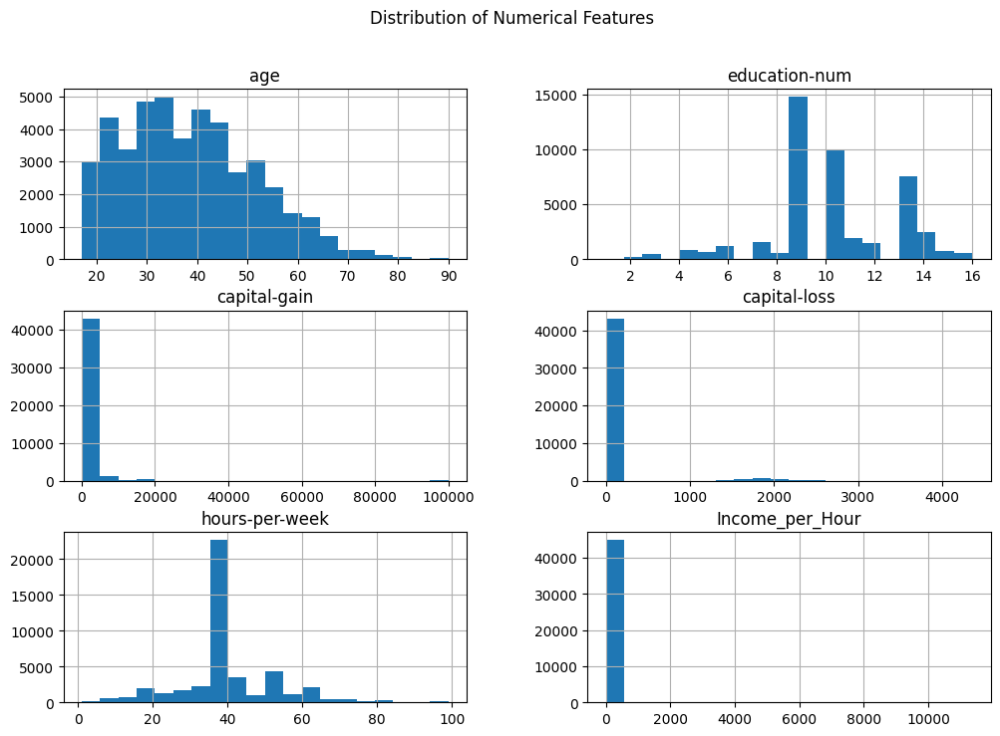

In [56]:
df.hist(figsize=(12, 8), bins=20)
plt.suptitle("Distribution of Numerical Features")
plt.show()


### Categorical Feature Distribution


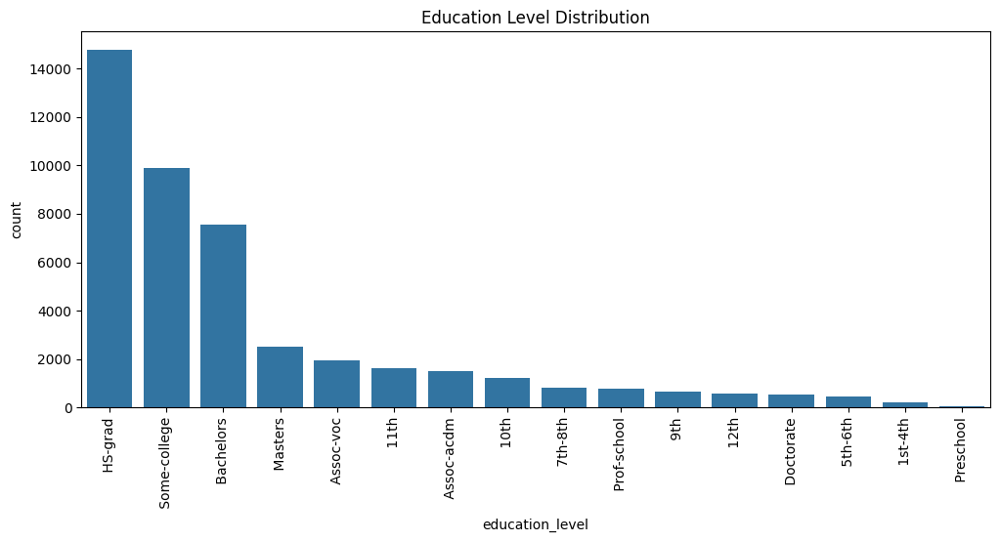

In [57]:
plt.figure(figsize=(12, 5))
sns.countplot(x='education_level', data=df, order=df['education_level'].value_counts().index)
plt.xticks(rotation=90)
plt.title("Education Level Distribution")
plt.show()

In [58]:
px.histogram(df, x='income')

In [59]:
# 6. Pie Chart - Gender Distribution
plt.figure(figsize=(8, 5))
fig = px.pie(df, names="sex", title="Gender Distribution")
fig.show()

<Figure size 800x500 with 0 Axes>

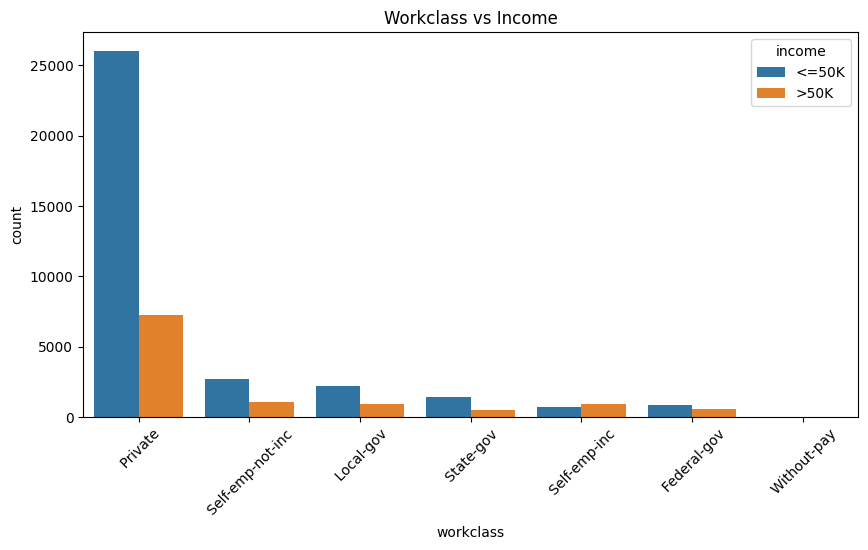

In [60]:
# ========== 7. Workclass vs Income Count Plot ==========
plt.figure(figsize=(10, 5))
sns.countplot(x="workclass", hue="income", data=df, order=df["workclass"].value_counts().index)
plt.xticks(rotation=45)
plt.title("Workclass vs Income")
plt.show()

# b) bivariate

C:\Users\Koky\AppData\Local\Temp\ipykernel_5480\15538814.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




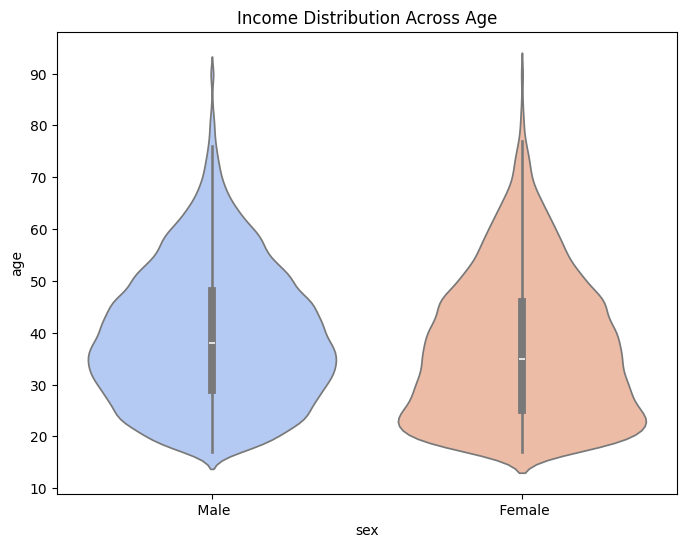

In [61]:
## num vs cat
# 2. Violin Plot - Age vs Income
plt.figure(figsize=(8, 6))
sns.violinplot(x=df['sex'], y=df['age'],palette="coolwarm")
plt.title("Income Distribution Across Age")
plt.show()

C:\Users\Koky\AppData\Local\Temp\ipykernel_5480\3422473924.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




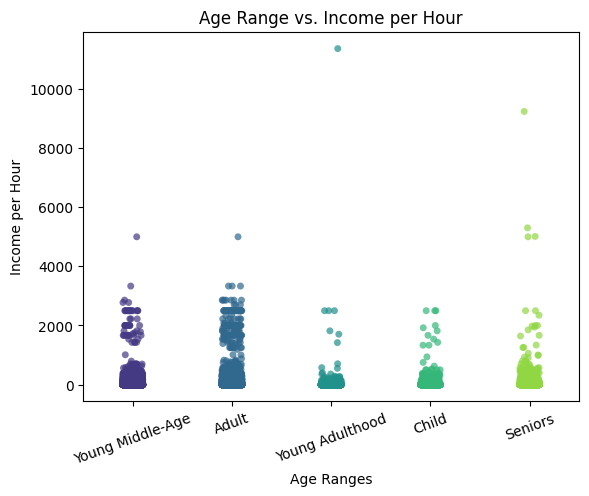

In [62]:
# Age Range vs. Income per Hour (Strip Plot)
sns.stripplot(data=df, x="Age Ranges", y="Income_per_Hour", jitter=True, palette="viridis", alpha=0.7)
plt.title("Age Range vs. Income per Hour")
plt.xlabel("Age Ranges")
plt.ylabel("Income per Hour")
plt.xticks(rotation=20)
plt.show()

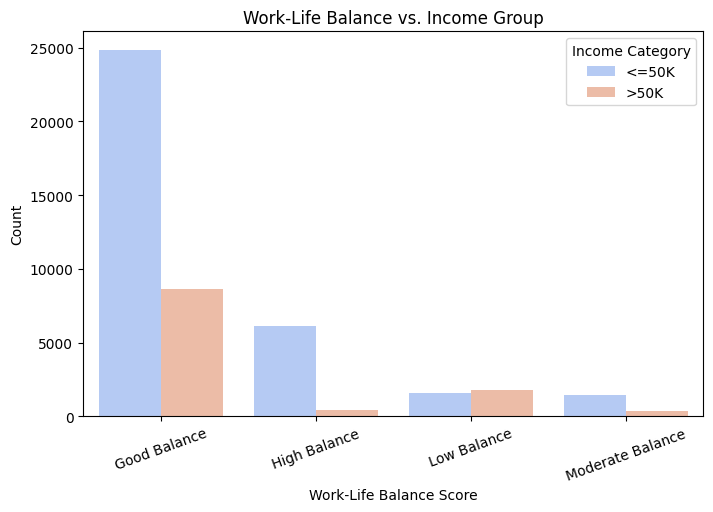

In [63]:
# 1. Work-Life Balance vs. Income Group (Bar Plot)
plt.figure(figsize=(8, 5))
sns.countplot(x="Work_Life_Balance", hue="income", data=df, palette="coolwarm")
plt.title("Work-Life Balance vs. Income Group")
plt.xlabel("Work-Life Balance Score")
plt.ylabel("Count")
plt.xticks(rotation=20)
plt.legend(title="Income Category")
plt.show()

In [64]:
px.histogram(df, y='income', color='Age Ranges')

In [65]:
px.histogram(df, y='education_level', color='income')

In [66]:
px.histogram(df, y='workclass', color='income')

In [67]:
px.histogram(df, y='occupation', color='income')

In [68]:
px.histogram(df, y='race', color='income')

In [69]:
px.histogram(df, x='Work_Life_Balance', color='Age Ranges')


<Axes: >

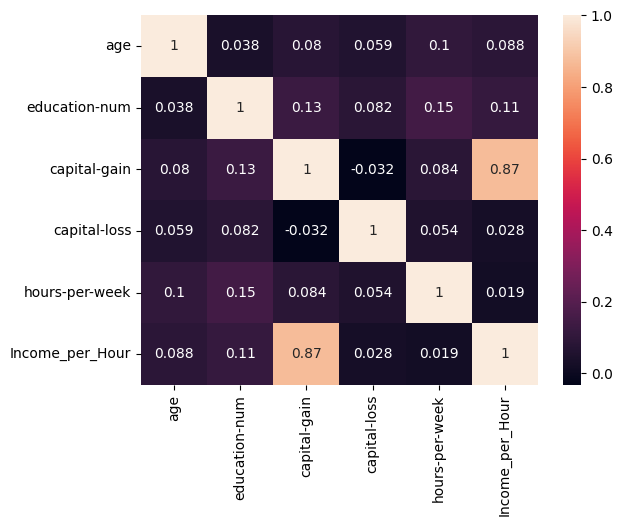

In [70]:
sns.heatmap(df.select_dtypes(include='number').corr(), annot=True)

## c) MultiVariate

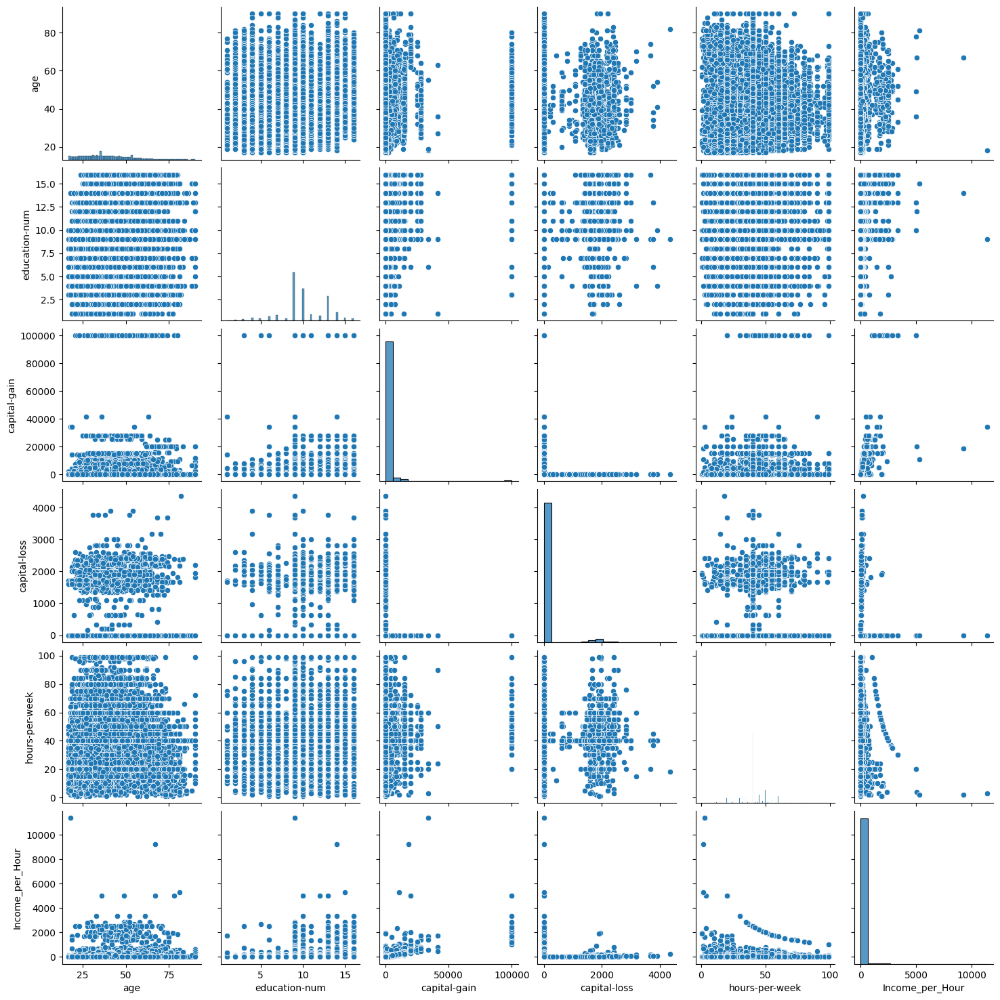

In [71]:
sns.pairplot(df.select_dtypes(include='number'))

In [72]:
df.columns

Index(['age', 'workclass', 'education_level', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income', 'Age Ranges', 'Work_Life_Balance', 'Income_per_Hour'],
      dtype='object')

# Pre-Processing
* 1) detect & handle nans and Outliers
* 2) train_test_split
* 3) Encoding
* 4) Handle Imbalanced Target
* 5) Scaling

In [73]:
# Detect & handle duplicates and NaNs to get accurate visuals

df.duplicated().sum()

np.int64(5982)

In [74]:
df.drop(['education_level','hours-per-week'],inplace=True,axis=1)
df.drop_duplicates(inplace=True)
df.reset_index(inplace=True,drop=True)

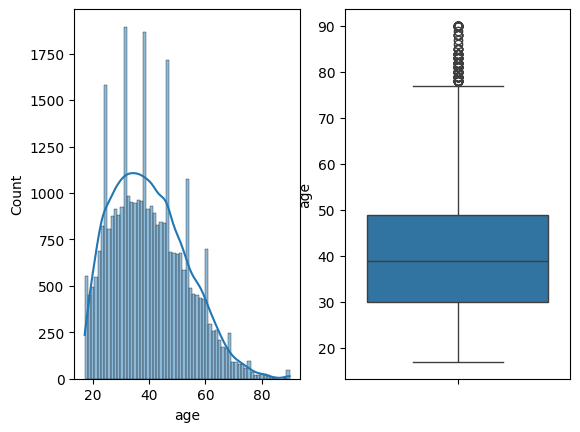

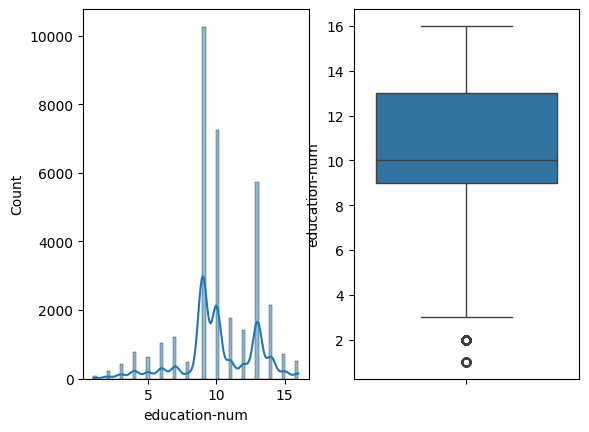

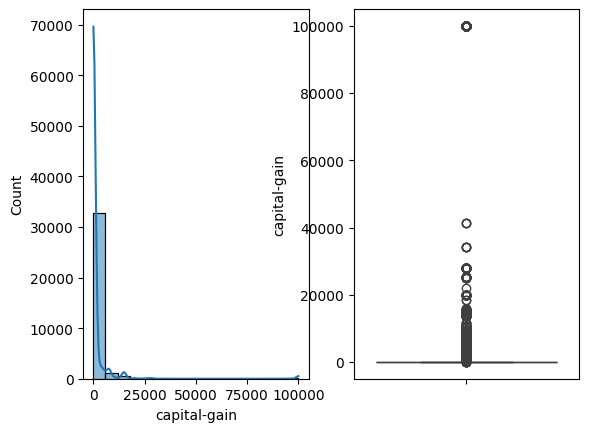

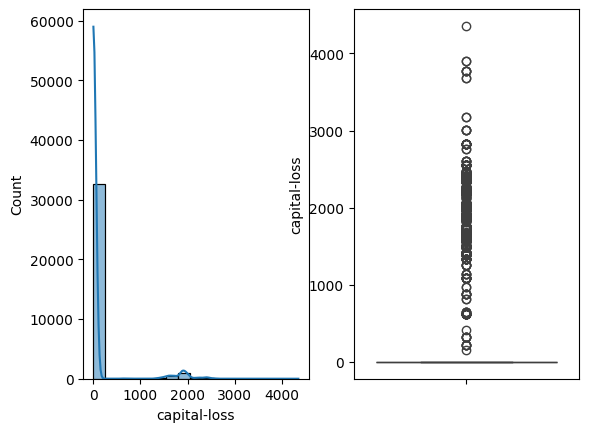

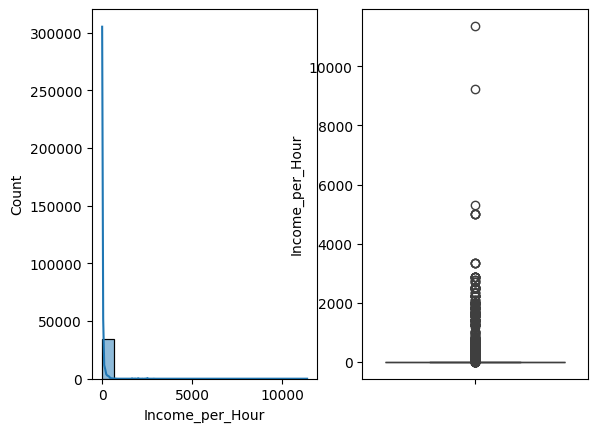

In [75]:
#2) detect & handle Outliers
# numeric -> histogram
num_cols = df.select_dtypes(include='number').columns
for col in num_cols:
    fig, axes = plt.subplots(nrows=1, ncols=2)
    sns.histplot(df[col], kde=True, ax=axes[0])
    sns.boxplot(df[col], ax=axes[1])
    plt.show()

In [76]:
#2)detect & handle NaNs
df.isna().sum()

age                  0
workclass            0
education-num        0
marital-status       0
occupation           0
relationship         0
race                 0
sex                  0
capital-gain         0
capital-loss         0
native-country       0
income               0
Age Ranges           0
Work_Life_Balance    0
Income_per_Hour      0
dtype: int64

In [77]:
# b) train_test_split
X = df.drop("income", axis=1)
y = df['income']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, stratify=y, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((27769, 14), (6943, 14), (27769,), (6943,))

In [78]:
from sklearn.base import TransformerMixin, BaseEstimator

class LogTransformer(BaseEstimator, TransformerMixin):
    
    # fit
    def fit(self, X, y=None):
        self.n_features_in = X.shape[1]
        return self
    
    # transformer
    def transform(self, X, y=None):
        assert self.n_features_in == X.shape[1]
        return np.log(X)
    
log_transformer = LogTransformer()
log_transformer

LogTransformer()

In [ ]:

from sklearn.compose import ColumnTransformer
from category_encoders import BinaryEncoder
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from sklearn.base import BaseEstimator, TransformerMixin

# ➤ Identify columns for transformations
ohe_features = ['workclass', 'race', 'sex', "marital-status", "occupation", "relationship"] 
binary_features = ["occupation", "native-country"]   
ordinal_features = ["Age Ranges", "Work_Life_Balance"]
numerical_features1 = ["age", "Income_per_Hour"]
numerical_features2 = ["capital-gain", "capital-loss"]
target_features = ["income"]

# ➤ Custom Transformer for Outlier Handling
class OutlierHandler(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self  

    def transform(self, X, y=None):
        X = pd.DataFrame(X).copy()  
        for col in X.columns:
            q1 = np.percentile(X[col], 25)
            q3 = np.percentile(X[col], 75)
            iqr = q3 - q1
            ub = q3 + 1.5 * iqr
            lb = q1 - 1.5 * iqr
            X[col] = np.clip(X[col], lb, ub)  
        return X
    def get_feature_names_out(self, input_features=None):
        return input_features if input_features is not None else []

# ➤ Custom Transformer for Log Transformation
class CustomTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, log_columns=None):
        self.log_columns = log_columns if log_columns else []

    def fit(self, X, y=None):
        return self 

    def transform(self, X, y=None):
        X = pd.DataFrame(X).copy()  
        for col in self.log_columns:
            X[col] = np.log1p(X[col]) 
        return X
    def get_feature_names_out(self, input_features=None):
        return input_features if input_features is not None else []
    

# ➤ Define individual transformers
ohe_transformer = OneHotEncoder(handle_unknown='ignore')
binary_transformer = BinaryEncoder()
ordinal_transformer = OrdinalEncoder()

# ➤ Pipelines for numerical data transformations
numerical_transformer1 = Pipeline(steps=[
    ('scaler', MinMaxScaler()),
    ('outliers', OutlierHandler())
])

numerical_transformer2 = Pipeline(steps=[
    ('custom_transform', CustomTransformer(log_columns=['capital-gain', 'capital-loss'])),
    ('scaler', MinMaxScaler())
])

# ➤ ColumnTransformer for feature processing
preprocessor = ColumnTransformer(transformers=[
    ('ohe', ohe_transformer, ohe_features),
    ('bin', binary_transformer, binary_features),
    ('ord', ordinal_transformer, ordinal_features),
    ('num1', numerical_transformer1, numerical_features1),
    ('num2', numerical_transformer2, numerical_features2)
],remainder="passthrough")

# ➤ Pipeline for feature transformation
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])


label_encoder = LabelEncoder()
y_train_transformed = label_encoder.fit_transform(y_train)
y_test_transformed = label_encoder.transform(y_test)

# Convert to DataFrame
y_train_transformed = pd.DataFrame(y_train_transformed, columns=["income"])
y_test_transformed = pd.DataFrame(y_test_transformed, columns=["income"])

# ➤ Fit & Transform Features and Target
X_train_transformed = pipeline.fit_transform(X_train)
X_test_transformed = pipeline.transform(X_test)



# ➤ Convert back to DataFrame
X_train_transformed = pd.DataFrame(X_train_transformed, columns=pipeline.named_steps['preprocessor'].get_feature_names_out())
X_test_transformed = pd.DataFrame(X_test_transformed, columns=pipeline.named_steps['preprocessor'].get_feature_names_out()) 



rndom_sampler = SMOTE(k_neighbors=4, random_state=42)


X_train_resampled, y_train_resampled = rndom_sampler.fit_resample(X=X_train_transformed , y=y_train_transformed ) 

feature_names = pipeline.named_steps['preprocessor'].get_feature_names_out()


# ➤ Check shapes
print("Original X_train shape:", X_train.shape)
print("Transformed X_train shape:", X_train_transformed.shape)
print("Resampled X_train shape:", y_train_resampled.shape)
print("Original y_train shape:", y_train.shape)
print("Transformed y_train shape:", y_train_transformed.shape)
print("Resampled y_train shape:", y_train_resampled.shape)

# Save pipeline and feature names
joblib.dump(pipeline, "preprocessor.pkl")
np.save("feature_names.npy", feature_names)


c:\Python312\Lib\site-packages\sklearn\pipeline.py:62: FutureWarning:

This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.



Original X_train shape: (27769, 14)
Transformed X_train shape: (27769, 58)
Resampled X_train shape: (41188, 1)
Original y_train shape: (27769,)
Transformed y_train shape: (27769, 1)
Resampled y_train shape: (41188, 1)


In [81]:
X_train_resampled.isna().sum()

ohe__workclass_ Federal-gov                   0
ohe__workclass_ Local-gov                     0
ohe__workclass_ Private                       0
ohe__workclass_ Self-emp-inc                  0
ohe__workclass_ Self-emp-not-inc              0
ohe__workclass_ State-gov                     0
ohe__workclass_ Without-pay                   0
ohe__race_ Amer-Indian-Eskimo                 0
ohe__race_ Asian-Pac-Islander                 0
ohe__race_ Black                              0
ohe__race_ Other                              0
ohe__race_ White                              0
ohe__sex_ Female                              0
ohe__sex_ Male                                0
ohe__marital-status_ Divorced                 0
ohe__marital-status_ Married-AF-spouse        0
ohe__marital-status_ Married-civ-spouse       0
ohe__marital-status_ Married-spouse-absent    0
ohe__marital-status_ Never-married            0
ohe__marital-status_ Separated                0
ohe__marital-status_ Widowed            

In [82]:
X_train_resampled.describe()

,ohe__workclass_ Federal-gov,ohe__workclass_ Local-gov,ohe__workclass_ Private,ohe__workclass_ Self-emp-inc,ohe__workclass_ Self-emp-not-inc,ohe__workclass_ State-gov,ohe__workclass_ Without-pay,ohe__race_ Amer-Indian-Eskimo,ohe__race_ Asian-Pac-Islander,ohe__race_ Black,...,bin__native-country_2,bin__native-country_3,bin__native-country_4,bin__native-country_5,ord__Age Ranges,ord__Work_Life_Balance,num1__age,num1__Income_per_Hour,num2__capital-gain,num2__capital-loss
count,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,...,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.0,41188.000000,41188.000000
mean,0.043430,0.083976,0.659618,0.060474,0.102801,0.049262,0.000439,0.009401,0.036704,0.094577,...,0.031884,0.033088,0.059456,0.945054,1.887953,0.476684,0.334573,0.0,0.121936,0.067681
std,0.201663,0.275405,0.471160,0.236537,0.301762,0.214426,0.020458,0.094650,0.185324,0.290234,...,0.172222,0.175912,0.233083,0.224975,1.868307,0.869781,0.170567,0.0,0.280765,0.232437
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.205479,0.0,0.000000,0.000000
50%,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.328767,0.0,0.000000,0.000000
75%,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,4.000000,1.000000,0.452055,0.0,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,3.000000,0.828767,0.0,1.000000,1.000000


In [83]:
X_test_transformed.isna().sum()

ohe__workclass_ Federal-gov                   0
ohe__workclass_ Local-gov                     0
ohe__workclass_ Private                       0
ohe__workclass_ Self-emp-inc                  0
ohe__workclass_ Self-emp-not-inc              0
ohe__workclass_ State-gov                     0
ohe__workclass_ Without-pay                   0
ohe__race_ Amer-Indian-Eskimo                 0
ohe__race_ Asian-Pac-Islander                 0
ohe__race_ Black                              0
ohe__race_ Other                              0
ohe__race_ White                              0
ohe__sex_ Female                              0
ohe__sex_ Male                                0
ohe__marital-status_ Divorced                 0
ohe__marital-status_ Married-AF-spouse        0
ohe__marital-status_ Married-civ-spouse       0
ohe__marital-status_ Married-spouse-absent    0
ohe__marital-status_ Never-married            0
ohe__marital-status_ Separated                0
ohe__marital-status_ Widowed            

In [84]:
y_train_resampled

,income
0,0
1,0
2,0
3,0
4,0
...,...
41183,1
41184,1
41185,1
41186,1


In [85]:
y_test.isna().sum()

np.int64(0)

In [86]:
y_train.value_counts(normalize=True) # stratify=y (classfication problems)

income
<=50K    0.741618
>50K     0.258382
Name: proportion, dtype: float64

In [87]:
y_train_resampled.value_counts()

income
0         20594
1         20594
Name: count, dtype: int64

# Modeling

In [88]:
from xgboost import XGBClassifier


In [90]:
y_train_resampled1 = y_train_resampled.values.ravel()

In [91]:
logistic_reg = LogisticRegression(random_state=42, C=300.0, max_iter=100000, warm_start=True, class_weight='balanced')
logistic_reg.fit( X_train_resampled,y_train_resampled1)   #.values.ravel()

LogisticRegression(C=300.0, class_weight='balanced', max_iter=100000,
                   random_state=42, warm_start=True)

In [92]:
y_valid_pred = cross_val_predict(logistic_reg,X_train_resampled,y_train_resampled1,cv=3) 
confusion_matrix(y_true=y_train_resampled1, y_pred=y_valid_pred)

array([[15940,  4654],
       [ 3993, 16601]])

In [93]:
y_train_pred = logistic_reg.predict(X_train_resampled)
y_test_pred = logistic_reg.predict(X_test_transformed)
print(f"Train Accuracy: {accuracy_score(y_train_resampled1, y_train_pred)}")
print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred)}")
print(f"Test accuracy: {round(accuracy_score(y_test_transformed, y_test_pred) * 100, 2)} %")

Train Accuracy: 0.7906914635330679
Validation Accuracy: 0.7900602117121491
Test accuracy: 78.58 %


In [94]:
print(f"Validation Precision Score: {precision_score(y_train_resampled1, y_valid_pred)}")
print(f"Validation f1 Score: {f1_score(y_train_resampled1, y_valid_pred)}")
print(f"Validation Recall Score: {recall_score(y_train_resampled1, y_valid_pred)}")

Validation Precision Score: 0.7810397553516819
Validation f1 Score: 0.7933761858108915
Validation Recall Score: 0.806108575313198


In [95]:
y_scores = cross_val_predict(logistic_reg, X_train_resampled, y_train_resampled1, cv=3, method='decision_function')
precsion_scores, recall_scores, thresholds = precision_recall_curve(y_train_resampled1, y_scores)

In [96]:
precsion_scores

array([0.5       , 0.50001214, 0.50002428, ..., 1.        , 1.        ,
       1.        ])

In [97]:
recall_scores

array([1.00000000e+00, 1.00000000e+00, 1.00000000e+00, ...,
       9.71156648e-05, 4.85578324e-05, 0.00000000e+00])

In [98]:
thresholds

array([-8.21153501, -8.20362952, -7.97282967, ...,  4.98548355,
        5.00556476,  5.06276728])

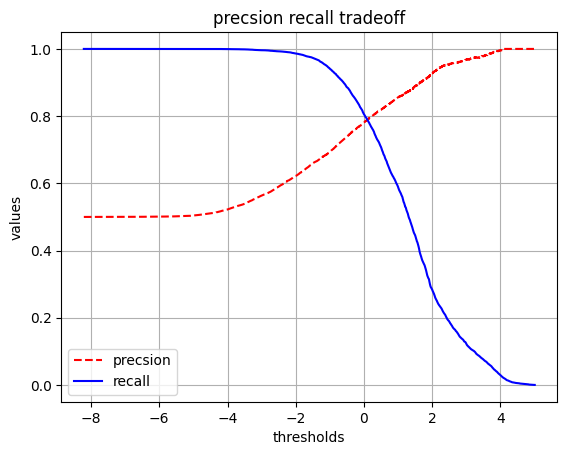

In [99]:
plt.plot(thresholds[:-1], precsion_scores[:-2], 'r--', label='precsion')
plt.plot(thresholds[:-1], recall_scores[:-2], 'b', label='recall')
plt.legend()
plt.title("precsion recall tradeoff")
plt.xlabel("thresholds")
plt.ylabel("values")
plt.grid()
plt.show()

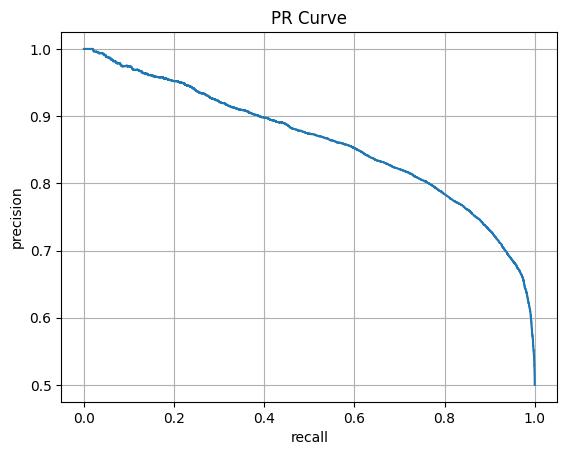

In [100]:
plt.plot(recall_scores[:-10], precsion_scores[:-10])
plt.title("PR Curve")
plt.xlabel("recall")
plt.ylabel("precision")
plt.grid()
plt.show()

In [101]:
fig = px.line(x=recall_scores[:-1], y=precsion_scores[:-1], hover_data=[thresholds])
fig.update_xaxes(title_text='recall')
fig.update_yaxes(title_text='precsison')

In [102]:
# 90 precsision
precision_90_indx = np.argmax(precsion_scores >= 0.86) # recall <= 0.9
precsion_scores[precision_90_indx], recall_scores[precision_90_indx]

(np.float64(0.8600117267663442), np.float64(0.5697776051277071))

In [103]:
t_precision_90 = thresholds[precision_90_indx]
t_precision_90

np.float64(1.080777114937125)

In [104]:
y_valid_scores = cross_val_predict(logistic_reg, X_train_resampled, y_train_resampled1, cv=3, method='decision_function')
y_valid_pred = (y_valid_scores >= t_precision_90) # prediciotn
print(f"Valid Precsison: {precision_score(y_train_resampled1, y_valid_pred)}")
print(f"Valid Recall: {recall_score(y_train_resampled1, y_valid_pred)}")

Valid Precsison: 0.8600117267663442
Valid Recall: 0.5697776051277071


In [105]:

y_test_pred = logistic_reg.predict(X_test_transformed)
print(f"Test Precsison: {precision_score(y_test_transformed, y_test_pred)}")
print(f"Test Recall: {recall_score(y_test_transformed, y_test_pred)}")

Test Precsison: 0.5593810444874274
Test Recall: 0.8060200668896321


In [106]:
y_test_scores = logistic_reg.decision_function(X_test_transformed)
y_test_pred = (y_test_scores >= t_precision_90)
print(f"Test Precsison: {precision_score(y_test_transformed, y_test_pred)}")
print(f"Test Recall: {recall_score(y_test_transformed, y_test_pred)}")
print(f"Test accuracy: {round(accuracy_score(y_test_transformed, y_test_pred) * 100, 2)} %")

Test Precsison: 0.6759921925829538
Test Recall: 0.5791527313266444
Test accuracy: 81.95 %


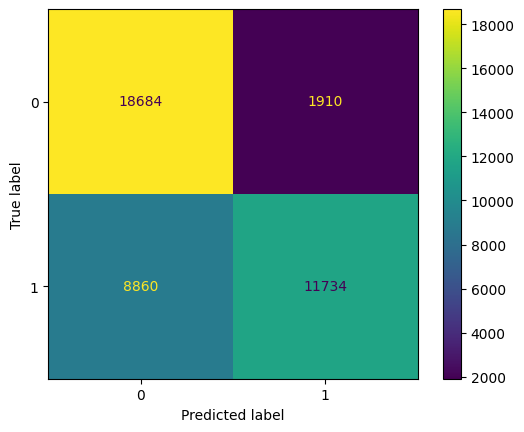

In [108]:
ConfusionMatrixDisplay.from_predictions(y_train_resampled1, y_valid_pred)

# ----------------------------------------------------------------------

## SGDClassifier

In [109]:
sgd_clf = SGDClassifier(max_iter=100000,alpha= 0.001, loss= 'hinge', penalty= 'l2', random_state=42)  
sgd_clf.fit(X_train_resampled, y_train_resampled1)

SGDClassifier(alpha=0.001, max_iter=100000, random_state=42)

In [110]:
y_valid_pred_sgd = cross_val_predict(sgd_clf, X_train_resampled, y_train_resampled1, cv=3)
y_train_pred_sgd = sgd_clf.predict(X_train_resampled)
print(f"Train Accuracy: {accuracy_score(y_train_resampled1, y_train_pred_sgd)}")
print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred_sgd)}")

Train Accuracy: 0.7796688355831796
Validation Accuracy: 0.7802758084879091


Validation Precision Score: 0.7650137741046832
Validation f1 Score: 0.7864256383631472
Validation Recall Score: 0.8090706030882782
Test accuracy: 77.2 %


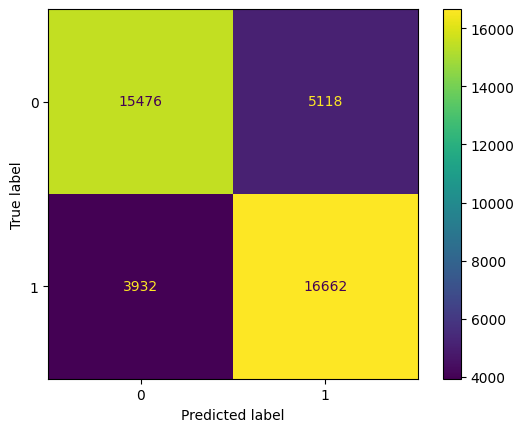

In [111]:
# Performance
y_test_pred_sgd = sgd_clf.predict(X_test_transformed)
print(f"Validation Precision Score: {precision_score(y_train_resampled1, y_valid_pred_sgd)}")
print(f"Validation f1 Score: {f1_score(y_train_resampled1, y_valid_pred_sgd)}")
print(f"Validation Recall Score: {recall_score(y_train_resampled1, y_valid_pred_sgd)}")
print(f"Test accuracy: {round(accuracy_score(y_test_transformed, y_test_pred_sgd) * 100, 2)} %")

'Accuracy of our tree model'

ConfusionMatrixDisplay.from_predictions(y_train_resampled1, y_valid_pred_sgd)

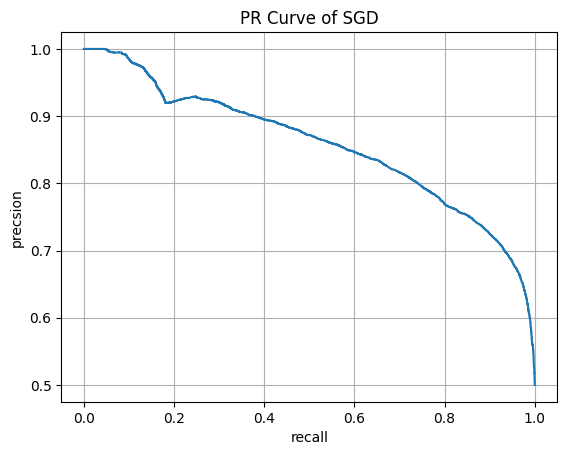

In [112]:
y_valid_scores_sgd = cross_val_predict(sgd_clf, X_train_resampled, y_train_resampled1, cv=3, method='decision_function')
precsison_sgd_scores, recall_sgd_scores, thresholds_sgd = precision_recall_curve(y_train_resampled1, y_valid_scores_sgd)
plt.plot(recall_sgd_scores[:-1], precsison_sgd_scores[:-1])
plt.title("PR Curve of SGD")
plt.xlabel('recall')
plt.ylabel('precsion')
plt.grid()
plt.show()

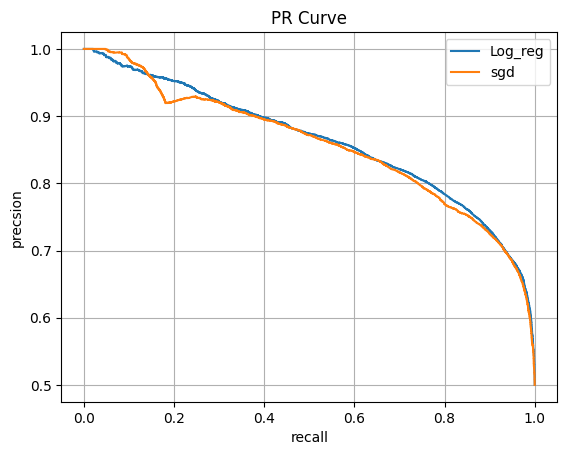

In [113]:
plt.plot(recall_scores[:-1], precsion_scores[:-1], label='Log_reg')
plt.plot(recall_sgd_scores[:-1], precsison_sgd_scores[:-1], label='sgd')
plt.legend()
plt.title("PR Curve")
plt.xlabel('recall')
plt.ylabel('precsion')
plt.grid()
plt.show()

In [114]:
y_valid_sgd_scores = y_valid_scores_sgd.copy()

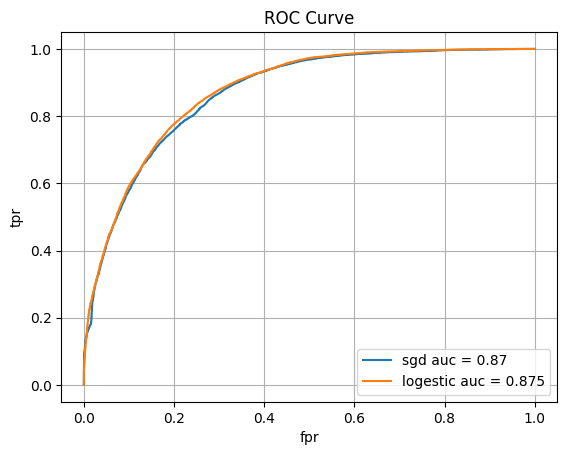

In [115]:
y_valid_logestic_scores = cross_val_predict(logistic_reg, X_train_resampled, y_train_resampled1, cv=3, method='decision_function')
fpr_logestic, tpr_logestic, thresholds_fpr_logestic_roc = roc_curve(y_train_resampled1, y_valid_logestic_scores)
fpr_sgd, tpr_sgd, thresholds_sgd_roc = roc_curve(y_train_resampled1, y_valid_sgd_scores)
plt.plot(fpr_sgd, tpr_sgd, label=f'sgd auc = {round(roc_auc_score(y_train_resampled1, y_valid_sgd_scores), 3)}')
plt.plot(fpr_logestic, tpr_logestic, label=f'logestic auc = {round(roc_auc_score(y_train_resampled1, y_valid_logestic_scores), 3)}')
plt.title("ROC Curve")
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend()
plt.grid()
plt.show()

# ----------------------------------------------------------------------

## DecisionTree Model

In [116]:
dt_clf = tree.DecisionTreeClassifier(max_depth =14,min_samples_split= 10,random_state=42)
dt_clf.fit(X_train_resampled, y_train_resampled1) 

y_train_pred_dt = dt_clf.predict(X_train_resampled)
y_test_pred_dt = dt_clf.predict(X_test_transformed)
print(f"Train Accuracy: {accuracy_score(y_train_resampled1, y_train_pred_dt)}")
y_valid_pred_dt = cross_val_predict(dt_clf, X_train_resampled, y_train_resampled1, cv=3)
print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred_dt)}")
print(f"Test accuracy: {round(accuracy_score(y_test_transformed, y_test_pred_dt) * 100, 2)} %")

Train Accuracy: 0.8513401961736428
Validation Accuracy: 0.8216956395066525
Test accuracy: 79.13 %


In [117]:
y_valid_scores_dr = cross_val_predict(sgd_clf, X_train_resampled, y_train_resampled1, cv=3, method='decision_function')
y_valid_dr_scores = y_valid_scores.copy()
fpr_dr, tpr_dr, thresholds_dr_roc = roc_curve(y_train_resampled1, y_valid_dr_scores)

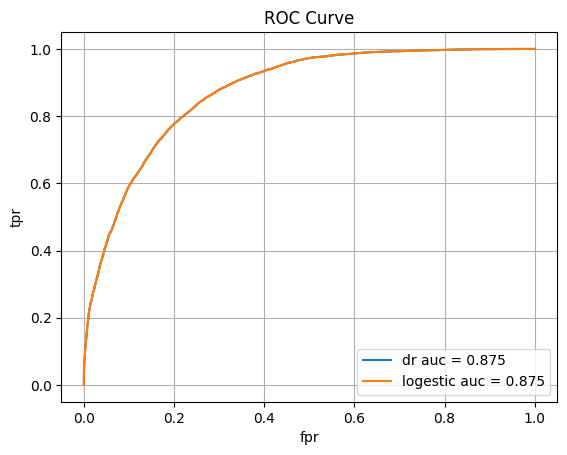

In [118]:
y_valid_logestic_scores = cross_val_predict(logistic_reg, X_train_resampled, y_train_resampled1, cv=3, method='decision_function')
fpr_logestic, tpr_logestic, thresholds_fpr_logestic_roc = roc_curve(y_train_resampled1, y_valid_logestic_scores)
fpr_dr, tpr_dr, thresholds_dr_roc = roc_curve(y_train_resampled1, y_valid_dr_scores)
plt.plot(fpr_dr, tpr_dr, label=f'dr auc = {round(roc_auc_score(y_train_resampled1, y_valid_dr_scores), 3)}')
plt.plot(fpr_logestic, tpr_logestic, label=f'logestic auc = {round(roc_auc_score(y_train_resampled1, y_valid_logestic_scores), 3)}')
plt.title("ROC Curve")
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.legend()
plt.grid()
plt.show()

# ----------------------------------------------------------------------

## KNN Model

In [119]:
knn = KNeighborsClassifier(n_neighbors=9, metric='manhattan', p=2,n_jobs=-1)
knn.fit(X_train_resampled, y_train_resampled1) # lazy classifier (instance based)

KNeighborsClassifier(metric='manhattan', n_jobs=-1, n_neighbors=9)

In [120]:
y_train_pred_knn = knn.predict(X_train_resampled)
y_test_pred_knn = knn.predict(X_test_transformed)
print(f"Train Accuracy: {accuracy_score(y_train_resampled1, y_train_pred_knn)}")
y_valid_pred_knn = cross_val_predict(knn, X_train_resampled, y_train_resampled1, cv=3)
print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred_knn)}")
print(f"Test accuracy: {round(accuracy_score(y_test_transformed, y_test_pred_knn) * 100, 2)} %")

Train Accuracy: 0.8455375352044284
Validation Accuracy: 0.8072254054579003
Test accuracy: 77.96 %


# ----------------------------------------------------------------------

## Naive Bayes Model

In [121]:
from sklearn.naive_bayes import GaussianNB
naive_bayes = GaussianNB()
naive_bayes.fit(X_train_resampled, y_train_resampled1)

GaussianNB()

In [122]:
y_train_pred_nb = naive_bayes.predict(X_train_resampled)
y_test_pred_nb = naive_bayes.predict(X_test_transformed)
print(f"Train Accuracy: {accuracy_score(y_train_resampled1, y_train_pred_nb)}")
y_valid_pred_nb = cross_val_predict(knn, X_train_resampled, y_train_resampled1, cv=3)
print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred_nb)}")
print(f"Test accuracy: {round(accuracy_score(y_test_transformed, y_test_pred_nb) * 100, 2)} %")

Train Accuracy: 0.7518209187141885
Validation Accuracy: 0.8072254054579003
Test accuracy: 69.65 %


In [123]:
multinomial_model = MultinomialNB(alpha=0.0001) 
multinomial_model.fit(X_train_resampled, y_train_resampled1)
y_valid_pred = cross_val_predict(multinomial_model, X_train_resampled, y_train_resampled1, cv=3)
y_test_pred_mul = multinomial_model.predict(X_test_transformed)

print(f"Train Accuracy: {multinomial_model.score(X_train_resampled, y_train_resampled1) * 100}")
print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred) * 100}")
print("-" * 50)
print(f"Validation Precision: {precision_score(y_train_resampled1, y_valid_pred)}")
print(f"Validation Recall: {recall_score(y_train_resampled1, y_valid_pred)}")
confusion_matrix(y_train_resampled1, y_valid_pred) # care more about recall
print(f"Test accuracy: {round(accuracy_score(y_test_transformed, y_test_pred_mul) * 100, 2)} %")

Train Accuracy: 77.04671263474798
Validation Accuracy: 77.07341944255607
--------------------------------------------------
Validation Precision: 0.7498991528842275
Validation Recall: 0.8124210935223851
Test accuracy: 75.63 %


In [124]:
bernouli_model = BernoulliNB(alpha=0.5, binarize=0,fit_prior=True)
bernouli_model.fit(X_train_resampled, y_train_resampled1)
y_valid_pred = cross_val_predict(bernouli_model, X_train_resampled, y_train_resampled1, cv=3)
y_test_pred_ber = bernouli_model.predict(X_test_transformed)
print(f"Train Accuracy: {bernouli_model.score(X_train_resampled, y_train_resampled1) * 100}")
print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred) * 100}")
print("-" * 50)
print(f"Validation Precision: {precision_score(y_train_resampled1, y_valid_pred)}")
print(f"Validation Recall: {recall_score(y_train_resampled1, y_valid_pred)}")
confusion_matrix(y_train_resampled1, y_valid_pred)
print(f"Test accuracy: {round(accuracy_score(y_test_transformed, y_test_pred_ber) * 100, 2)} %")

Train Accuracy: 76.17752743517529
Validation Accuracy: 76.1119743614645
--------------------------------------------------
Validation Precision: 0.7397993311036789
Validation Recall: 0.8055744391570361
Test accuracy: 74.65 %


# ----------------------------------------------------------------------

## SVM Model

In [125]:
linear_svm = SVC(C=10, random_state=42, max_iter=10000000,gamma='scale', kernel='rbf')
linear_svm.fit(X_train_resampled, y_train_resampled1)

SVC(C=10, max_iter=10000000, random_state=42)

In [126]:
print(f"Train Accuracy: {linear_svm.score(X_train_resampled, y_train_resampled1)}")

y_valid_pred_svm = cross_val_predict(linear_svm, X_train_resampled, y_train_resampled1, cv=3)
y_pred_svm = linear_svm.predict(X_test_transformed)

print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred_svm )}")
print(f"Validation precision: {precision_score(y_train_resampled1, y_valid_pred_svm )}")
print(f"Validation recall: {recall_score(y_train_resampled1, y_valid_pred_svm )}")
print(f"Validation f1: {f1_score(y_train_resampled1, y_valid_pred_svm )}")

'SVM Accuracy:'
f'{round(accuracy_score(y_test_transformed, y_pred_svm) * 100, 2)} %'

Train Accuracy: 0.8463630183548606
Validation Accuracy: 0.8200932310381664
Validation precision: 0.7891228070175439
Validation recall: 0.8736525201515004
Validation f1: 0.8292390653085681


'78.34 %'

In [127]:
# pipe
svm_pipe = Pipeline(steps=[
    ("scale", StandardScaler()),
    ("model", SVC(C=1.0, kernel='poly', degree=3, coef0=10, random_state=42)),
])

svm_pipe.fit(X_train_resampled, y_train_resampled1)

Pipeline(steps=[('scale', StandardScaler()),
                ('model', SVC(coef0=10, kernel='poly', random_state=42))])

In [128]:
print(f"Train Accuracy: {svm_pipe.score(X_train_resampled, y_train_resampled1)}")

y_valid_pred_svm_pipe = cross_val_predict(svm_pipe, X_train_resampled, y_train_resampled1, cv=3)
y_pred_svm_pipe = svm_pipe.predict(X_test_transformed)

print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred_svm_pipe )}")
print(f"Validation precision: {precision_score(y_train_resampled1, y_valid_pred_svm_pipe )}")
print(f"Validation recall: {recall_score(y_train_resampled1, y_valid_pred_svm_pipe )}")
print(f"Validation f1: {f1_score(y_train_resampled1, y_valid_pred_svm_pipe )}")

'SVM Accuracy:'
f'{round(accuracy_score(y_test_transformed, y_pred_svm_pipe) * 100, 2)} %'

Train Accuracy: 0.848960862387103
Validation Accuracy: 0.8171797610954648
Validation precision: 0.7913210239942913
Validation recall: 0.8615616198892881
Validation f1: 0.8249488562395387


'78.45 %'

# ----------------------------------------------------------------------

## RandomForest Model

In [129]:
rf_clf = RandomForestClassifier(max_depth=20, n_estimators=300, max_samples=0.3,min_samples_split=2, max_features=1.0,max_leaf_nodes=16, bootstrap=True,n_jobs=-1, oob_score=True, random_state=42) 
rf_clf.fit(X_train_resampled, y_train_resampled1)

print(f"Train Accuracy: {rf_clf.score(X_train_resampled, y_train_resampled1)}") 
print(f"Validation Accuracy: {rf_clf.oob_score_}")
y_test_pred_rf = rf_clf.predict(X_test_transformed)
print(f'{round(accuracy_score(y_test_transformed, y_test_pred_rf) * 100, 2)} %')

Train Accuracy: 0.8030979897057395
Validation Accuracy: 0.8020539963096047
78.93 %


## ExtraTreesClassifier

In [130]:
extra_clf = ExtraTreesClassifier(max_depth=20, n_estimators=300, max_samples=0.3,min_samples_split= 10, max_features=1.0, bootstrap=True, oob_score=True, random_state=42) #5 1000 
extra_clf.fit(X_train_resampled, y_train_resampled1)

print(f"Train Accuracy: {extra_clf.score(X_train_resampled, y_train_resampled1)}") # overfit: regularize 1 DT
print(f"Validation Accuracy: {extra_clf.oob_score_}")
y_test_pred_extr = extra_clf.predict(X_test_transformed)
print(f'{round(accuracy_score(y_test_transformed, y_test_pred_extr) * 100, 2)} %')

Train Accuracy: 0.8717830436049335
Validation Accuracy: 0.8475041274157522
80.21 %


## xgboostClassifier

In [158]:
from xgboost import XGBClassifier

xgboost_reg = XGBClassifier(learning_rate=0.5, max_depth=2, random_state=42,enable_categorical=True) 
xgboost_reg.fit(X_train_resampled, y_train_resampled1)

xg_valid = cross_val_score(xgboost_reg, X_train_resampled, y_train_resampled1, cv=5)  
print(f"Train Accuracy: {xgboost_reg.score(X_train_resampled, y_train_resampled1)}")
y_test_pred_xg =xgboost_reg.predict(X_test_transformed)
print(f'{round(accuracy_score(y_test_transformed, y_test_pred_xg) * 100, 2)} %')
print(f"Validation Accuracy: {np.mean(xg_valid)}")


Train Accuracy: 0.8784354666407691
84.85 %
Validation Accuracy: 0.8679242369541351


# ------------------------------------------------------------

# Ensambling

# 1) Bagging

In [132]:
rf_bagging = BaggingClassifier(DecisionTreeClassifier(max_depth =14,min_samples_split= 10,random_state=42), n_estimators=1000, max_samples=0.3, max_features=1.0, bootstrap=True, random_state=42)
rf_bagging.fit(X_train_resampled, y_train_resampled1)

BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=14,
                                                   min_samples_split=10,
                                                   random_state=42),
                  max_samples=0.3, n_estimators=1000, random_state=42)

In [133]:
y_valid_pred_dtbag = cross_val_predict(rf_bagging, X_train_resampled, y_train_resampled1, cv=3) 
print(f"Train Accuracy: {rf_bagging.score(X_train_resampled, y_train_resampled1)}") 
print(f"Validation Accuracy: {accuracy_score(y_train_resampled1, y_valid_pred_dtbag)}")
y_test_pred_extr = rf_bagging.predict(X_test_transformed)
print(f'{round(accuracy_score(y_test_transformed, y_test_pred_extr) * 100, 2)} %')

Train Accuracy: 0.8645964844129358
Validation Accuracy: 0.8378896766048364
80.3 %


# 2) Voting

In [159]:
voting_clf = VotingClassifier(estimators=[
    ('XGB', XGBClassifier(learning_rate=0.5, max_depth=2, random_state=42,enable_categorical=True)),
    ('AdaBoost', AdaBoostClassifier(n_estimators=1000, learning_rate=1.0, random_state=42)),
    ('GradientBoostingTree', GradientBoostingClassifier(learning_rate=0.1, n_estimators=5000, n_iter_no_change=10, random_state=42)),
    ],
    voting='soft',
    n_jobs=-1
)
voting_clf.fit(X_train_resampled, y_train_resampled1)

y_pred_stack = voting_clf.predict(X_test_transformed)

'ADABoost Classifier with Decision Tree Accuracy:'
f'{round(accuracy_score(y_test_transformed, y_pred_stack) * 100, 2)} %'

'86.3 %'

In [135]:
print(f"Train Accuracy: {voting_clf.score(X_train_resampled, y_train_resampled1)}")

Train Accuracy: 0.8927843061085753


In [136]:
voting_clf1 = VotingClassifier(estimators=[
    ('Extree',ExtraTreesClassifier(max_depth=20, n_estimators=300, max_samples=0.3,min_samples_split= 10, max_features=1.0, bootstrap=True, oob_score=True, random_state=42)),
    ('AdaBoost', AdaBoostClassifier(n_estimators=1000, learning_rate=1.0, random_state=42)),
    ('GradientBoostingTree', GradientBoostingClassifier(learning_rate=0.1, n_estimators=5000, n_iter_no_change=10, random_state=42)),
    ],
    voting='soft',
    n_jobs=-1
)
voting_clf1.fit(X_train_resampled, y_train_resampled1)

y_pred_stack = voting_clf1.predict(X_test_transformed)

'ADABoost Classifier with Decision Tree Accuracy:'
f'{round(accuracy_score(y_test_transformed, y_pred_stack) * 100, 2)} %'

'84.82 %'

In [137]:
voting_clf2 = VotingClassifier(estimators=[
    ('Extree',ExtraTreesClassifier(max_depth=20, n_estimators=300, max_samples=0.3,min_samples_split= 10, max_features=1.0, bootstrap=True, oob_score=True, random_state=42)),
    ('bag', BaggingClassifier(n_estimators=1000, max_samples=0.3, max_features=1.0, bootstrap=True, random_state=42)),
    ('GradientBoostingTree', GradientBoostingClassifier(learning_rate=0.1, n_estimators=5000, n_iter_no_change=10, random_state=42)),
    ],
    voting='soft',
    n_jobs=-1
)
voting_clf2.fit(X_train_resampled, y_train_resampled1)

y_pred_stack = voting_clf2.predict(X_test_transformed)

'ADABoost Classifier with Decision Tree Accuracy:'
f'{round(accuracy_score(y_test_transformed, y_pred_stack) * 100, 2)} %'

'84.06 %'

# Feature Importance

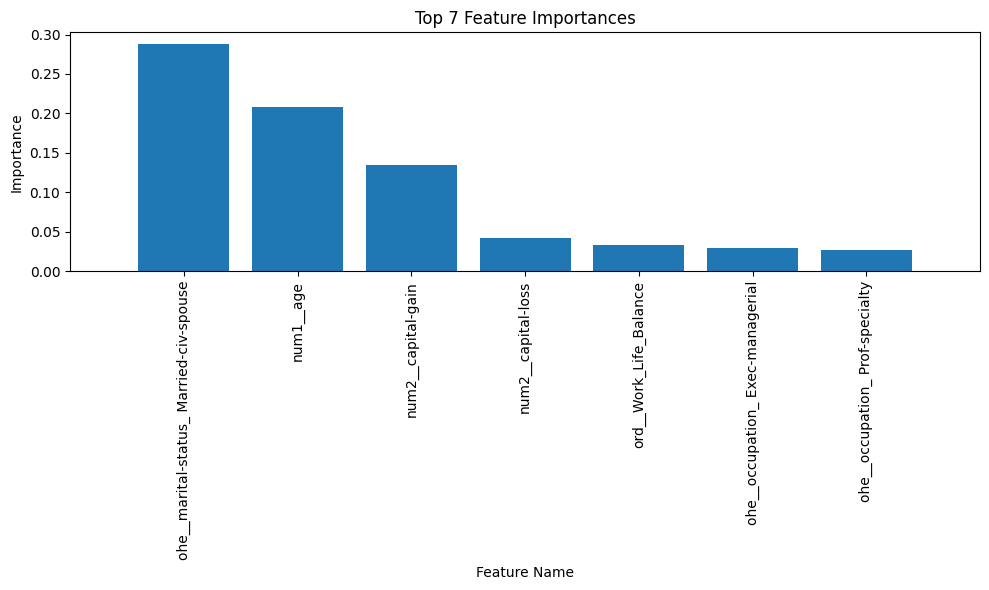

In [138]:
model = DecisionTreeRegressor(random_state=42)
model=model.fit(X_train_resampled, y_train_resampled1)
importances = model.feature_importances_

indices = np.argsort(importances)[::-1]

feature_names = X_train_resampled.columns if hasattr(X_train_resampled, 'columns') else [f'Feature {i}' for i in range(X_train_resampled.shape[1])]

# Plot the feature importances
top_n = 7
top_indices = indices[:top_n]
plt.figure(figsize=(10, 6))
plt.title("Top 7 Feature Importances")
plt.bar(range(top_n), importances[top_indices], align="center")
plt.xticks(range(top_n), np.array(feature_names)[top_indices], rotation=90)
plt.xlim([-1, top_n])
plt.xlabel("Feature Name")
plt.ylabel("Importance")
plt.tight_layout()  
plt.show()

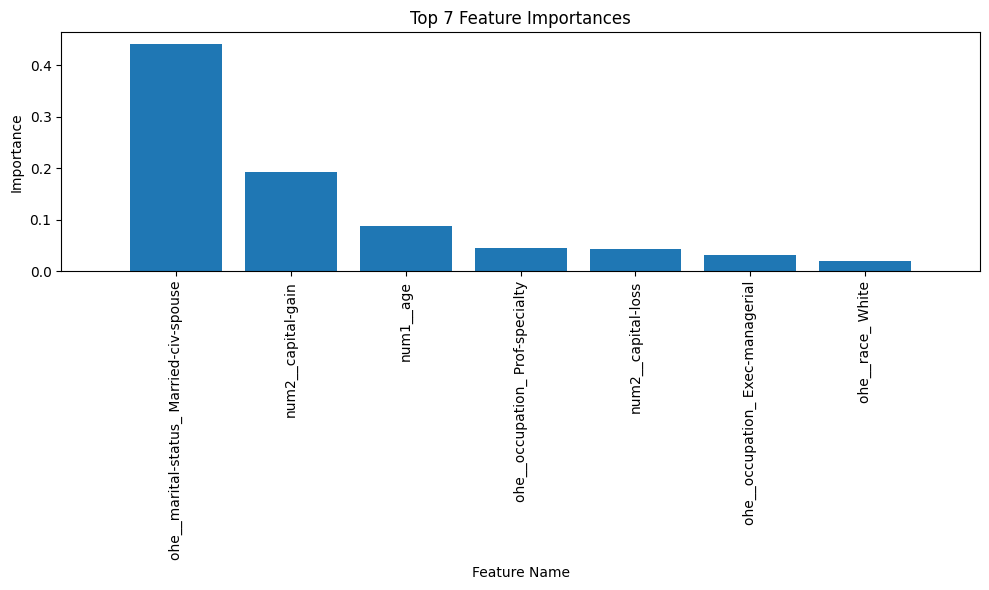

In [139]:

model = GradientBoostingClassifier(random_state=42)
model=model.fit(X_train_resampled, y_train_resampled1)

importances = model.feature_importances_

indices = np.argsort(importances)[::-1]
feature_names = X_train_resampled.columns if hasattr(X_train_resampled, 'columns') else [f'Feature {i}' for i in range(X_train_resampled.shape[1])]

# Plot the feature importances
top_n = 7
top_indices = indices[:top_n]
plt.figure(figsize=(10, 6))
plt.title("Top 7 Feature Importances")
plt.bar(range(top_n), importances[top_indices], align="center")
plt.xticks(range(top_n), np.array(feature_names)[top_indices], rotation=90)
plt.xlim([-1, top_n])
plt.xlabel("Feature Name")
plt.ylabel("Importance")
plt.tight_layout()  
plt.show()

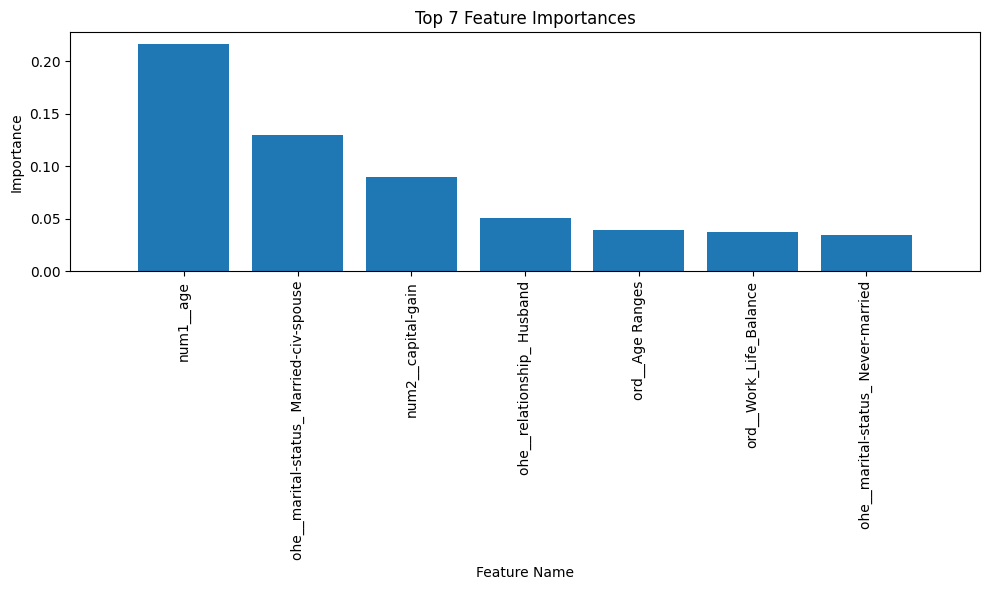

In [140]:

model = ExtraTreesClassifier(random_state=42)
model=model.fit(X_train_resampled, y_train_resampled1)
importances = model.feature_importances_


indices = np.argsort(importances)[::-1]
feature_names = X_train_resampled.columns if hasattr(X_train_resampled, 'columns') else [f'Feature {i}' for i in range(X_train_resampled.shape[1])]

# Plot the feature importances
top_n = 7
top_indices = indices[:top_n]
plt.figure(figsize=(10, 6))
plt.title("Top 7 Feature Importances")
plt.bar(range(top_n), importances[top_indices], align="center")
plt.xticks(range(top_n), np.array(feature_names)[top_indices], rotation=90)
plt.xlim([-1, top_n])
plt.xlabel("Feature Name")
plt.ylabel("Importance")
plt.tight_layout()  
plt.show()

In [141]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 20594, number of negative: 20594
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5124
[LightGBM] [Info] Number of data points in the train set: 41188, number of used features: 55
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


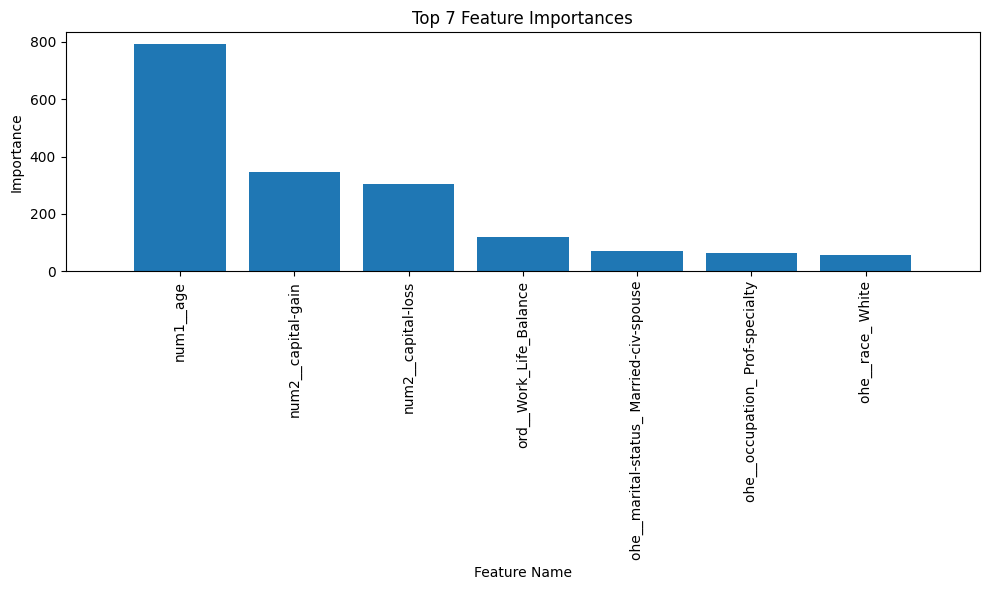

In [142]:

model = lgb.LGBMClassifier(random_state=42)
model=model.fit(X_train_resampled, y_train_resampled1)
importances = model.feature_importances_


indices = np.argsort(importances)[::-1]
feature_names = X_train_resampled.columns if hasattr(X_train_resampled, 'columns') else [f'Feature {i}' for i in range(X_train_resampled.shape[1])]

# Plot the feature importances
top_n = 7
top_indices = indices[:top_n]
plt.figure(figsize=(10, 6))
plt.title("Top 7 Feature Importances")
plt.bar(range(top_n), importances[top_indices], align="center")
plt.xticks(range(top_n), np.array(feature_names)[top_indices], rotation=90)
plt.xlim([-1, top_n])
plt.xlabel("Feature Name")
plt.ylabel("Importance")
plt.tight_layout()  
plt.show()

# --------------------------------------------------------------------------

## Hyperparameter Tuning

In [160]:
# Define models and hyperparameter grids
models = {
    
    'LogisticRegression': (LogisticRegression(random_state=42,max_iter=100000), {'classifier__C': [1, 10,300]}),
    'SGDClassifier': (SGDClassifier(max_iter=100000,random_state=42), {'classifier__alpha': [0.0001, 0.001, 0.01]}),
    'KNeighborsClassifier': (KNeighborsClassifier(p=2,n_jobs=-1), {'classifier__n_neighbors': [3, 5,7,9]}),
    'BernoulliNB': (BernoulliNB(binarize=0,fit_prior=True), {'classifier__alpha': [0.1, 0.5, 1.0]}),
    'DecisionTreeClassifier': (DecisionTreeClassifier(min_samples_split= 10,random_state=42), {'classifier__max_depth': [10, 14, 20]}),
    'RandomForestClassifier': (RandomForestClassifier(max_depth=20,max_samples=0.3,min_samples_split=2, max_features=1.0,max_leaf_nodes=16, bootstrap=True,n_jobs=-1, oob_score=True, random_state=42), {'classifier__n_estimators': [100, 200,300]}),
    'ExtraTreesClassifier': (ExtraTreesClassifier(max_depth=20,max_samples=0.3,min_samples_split= 10, max_features=1.0, bootstrap=True, oob_score=True, random_state=42), {'classifier__n_estimators': [100, 200,300]}),
    'svm':(SVC(random_state=42, max_iter=1000000,gamma='scale', kernel='rbf'), {'classifier__C': [1, 10,20]}),
    'AdaBoostClassifier': (AdaBoostClassifier(), {'classifier__n_estimators': [50, 100]}),
    'BaggingClassifier': (BaggingClassifier(), {'classifier__n_estimators': [10, 20,50]}),
    'XGBClassifier': (XGBClassifier( max_depth=2, random_state=42,enable_categorical=True), {'classifier__n_estimators': [100, 200],'classifier__alpha': [0.1, 0.5, 1.0]}),
    
}

In [161]:
best_models = {}  # Store best model pipelines
best_scores = {}  # Store corresponding best scores

for model_name, (model, param_grid) in models.items():
    pipeline = Pipeline(steps=[
        ('classifier', model)
    ])
    
    grid_search = GridSearchCV(pipeline, param_grid, cv=3, scoring='accuracy')
    grid_search.fit(X_train_resampled, y_train_resampled1)
    
    # Store best model & its best score
    best_models[model_name] = grid_search.best_estimator_
    best_scores[model_name] = grid_search.best_score_
    
    print(f"{model_name} best score: {grid_search.best_score_}")

# Get best model name based on highest accuracy score
best_model_name = max(best_scores, key=best_scores.get)
best_model = best_models[best_model_name]

print(f"Best model: {best_model_name} with score {best_scores[best_model_name]}")


LogisticRegression best score: 0.8037536292600121
SGDClassifier best score: 0.8023697115836991
KNeighborsClassifier best score: 0.8307034985883494
BernoulliNB best score: 0.7651744991768399
DecisionTreeClassifier best score: 0.8342489748540184
RandomForestClassifier best score: 0.811693066517658
ExtraTreesClassifier best score: 0.8520450196146753
svm best score: 0.8143635415830567
AdaBoostClassifier best score: 0.8281545289209143
BaggingClassifier best score: 0.8448600613643729
XGBClassifier best score: 0.854935516869031
Best model: XGBClassifier with score 0.854935516869031


In [162]:
# Define base estimators for ensemble models using best trained models
base_estimators = [
    ('xg', best_models['XGBClassifier']),
    ('bg', best_models['BaggingClassifier']),
    ('dt', best_models['DecisionTreeClassifier']),
    ('extt', best_models['ExtraTreesClassifier']),
]

# ➤ Voting Classifier (hard & soft voting)
voting_clf = VotingClassifier(estimators=base_estimators, voting='soft', n_jobs=-1)
voting_params = {'classifier__voting': ['soft']}

# ➤ Stacking Classifier (uses Logistic Regression as meta-model)
stacking_clf = StackingClassifier(estimators=base_estimators, final_estimator=LogisticRegression())
stacking_params = {'classifier__final_estimator__C': [1, 10, 100]}

# Train and evaluate VotingClassifier
pipeline_voting = Pipeline(steps=[('classifier', voting_clf)])
grid_voting = GridSearchCV(pipeline_voting, voting_params, cv=3, scoring='accuracy')
grid_voting.fit(X_train_resampled, y_train_resampled1)

# Train and evaluate StackingClassifier
pipeline_stacking = Pipeline(steps=[('classifier', stacking_clf)])
grid_stacking = GridSearchCV(pipeline_stacking, stacking_params, cv=3, scoring='accuracy')
grid_stacking.fit(X_train_resampled, y_train_resampled1)

# Store best ensemble models
best_models['VotingClassifier'] = grid_voting.best_estimator_
best_models['StackingClassifier'] = grid_stacking.best_estimator_

print(f"VotingClassifier best score: {grid_voting.best_score_}")
print(f"StackingClassifier best score: {grid_stacking.best_score_}")



VotingClassifier best score: 0.8625342329093545
StackingClassifier best score: 0.8439622590026965


# --------------------------------------------------------------------------

# Save Model

In [163]:
import pickle
joblib.dump(best_models['VotingClassifier'], 'best_model.pkl')
#pickle.dump(voting_clf, open("Orphans_charity_classificationmodel.pkl","wb"))


['best_model.pkl']